##Q1


In [6]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow
%cd "/content/drive/My Drive/Colab Notebooks/Assignment_1"


def image_matting(fg ,bg):
    fg_temp = np.copy(fg)
    fg_temp = cv2.cvtColor(fg_temp, cv2.COLOR_BGR2HSV)
    lower_green = np.array([40, 40, 40])
    upper_green = np.array([70, 255, 255])

    mask = cv2.inRange(fg_temp, lower_green ,upper_green)
    masked_image = np.copy(fg_temp)
    masked_image = cv2.cvtColor(masked_image, cv2.COLOR_HSV2RGB)
   
    masked_image[mask != 0] = [0, 0, 0]
   
    bg = cv2.cvtColor(bg, cv2.COLOR_BGR2RGB)
    bg[mask == 0] = [0, 0, 0]
    
    final_image = bg + masked_image
    
    return final_image 



/content/drive/My Drive/Colab Notebooks/Assignment_1


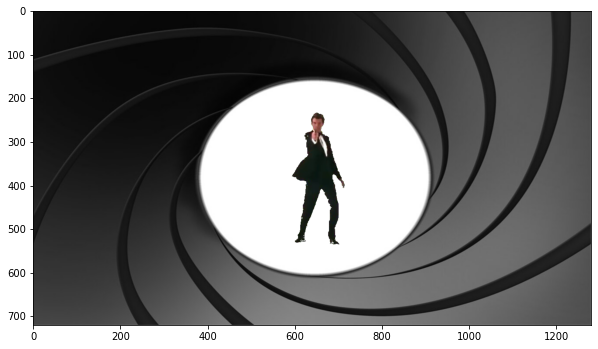

In [ ]:
#sub Q1
fg = cv2.imread('./images/fg.jpg')
bg = cv2.imread('./images/bg.jpg')

img = image_matting(fg,bg)

plt.figure(figsize = (10,10))
plt.imshow(img)
#cv2_imshow(img)

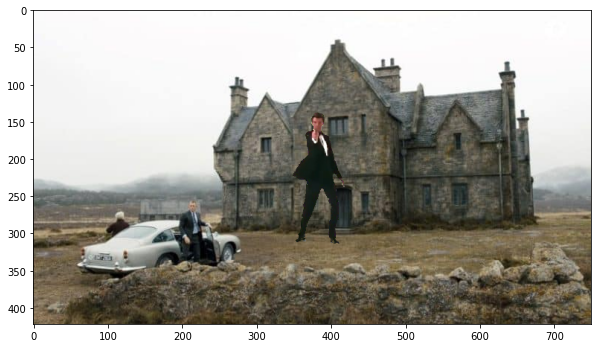

In [ ]:
#sub Q2
fg = cv2.imread('./images/fg.jpg')
bg = cv2.imread('./images/house.jpg')

resized_image = cv2.resize(fg ,(bg.shape[1] ,bg.shape[0]), interpolation = cv2.INTER_NEAREST)
img = image_matting(resized_image ,bg)

plt.figure(figsize = (10,10))
plt.imshow(img)

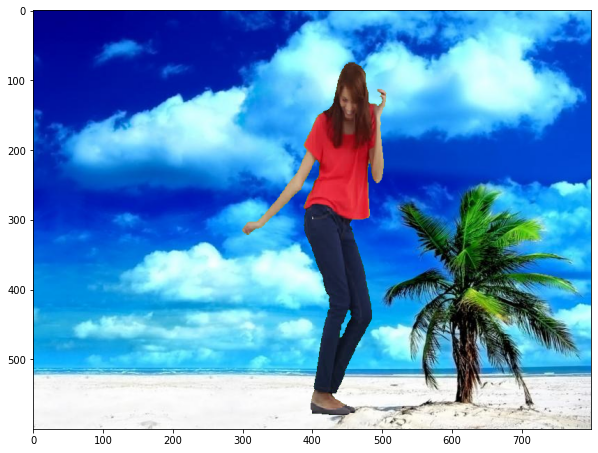

In [ ]:
#sub Q3
fg = cv2.imread('./images/myfg.jpg')
bg = cv2.imread('./images/mybg.jpg')

resized_image = cv2.resize(fg ,(bg.shape[1] ,bg.shape[0]), interpolation = cv2.INTER_NEAREST)
img = image_matting(resized_image ,bg)

plt.figure(figsize = (10,10))
plt.imshow(img)

2. As you are a focused agent, you are also worried about how many images you can
store on the MI6 cloud with a size of 4 GB. If your fake trail colour images happen
to have a size of 1280 x 720, and are stored for displaying on standard displays,
calculate the number of images you can store in the cloud.


  We are givne,
  Storage size = 4GB 
  Image Size = 1280 X 720 
            = 1280 X 720 X 3 Bytes  becaz of RBG channel 
  
  No of Images that can be stored = 4GB / (1280 X 720 X 3)
                                  = ( 4 X 1024 X 1024 X 1024 ) / ( 1280 X 720 X 3 )
  
                                  = 1553 Images 

###**Q2**

Image size = 168.69 MB 

Height and width of Square image = x

Each pixel will occupy 24 bit ,3 Bytes as image is RGB Image 

So ,

                        3 * x * x B = 168.69 MB
                        x*x = 168.69/3 MB
                        x = 7677 pixel


###Q3

Given that,
==> height of insignia x = 32.8 cm = 328 mm

==> CCD sensor Dimension = 10 X 10 mm Sensor consist 1024 X 1024 Pixels

==> Focal Length of Camara f = 62.5mm

==> Atleast 50 pixels in captured image's height is needed

==>   1024 pixels are there in 10mm then 50 pixels are there in (10*50)/1024

==> required minimum height of captured image h = (10*50)/1024 = 0.4882 mm

Consider Lens Formula

              (1/u) + (1/v) = (1/f)     ..(A)
 
    where  u = Distance of the insignia from lens 
           v = Distance of the image genrated on ccd sensor
           f = focal length 
we know that,

    ( insignia height) / ( distance of insignia from lens) = (captured image height ) / ( distance of image from lens)
 
 
                ( x / u ) = ( h / v )    ..(B)

  from (A) and (B)
  
            ( 328 / u ) = (( 0.4882 ) (u - 62.5)) /(62.5*u)
 
                    328 = 0.4882*u - 30.5125
 
                       u = 734.355 mm 

##Q5

/content/drive/My Drive/Colab Notebooks/Assignment_1


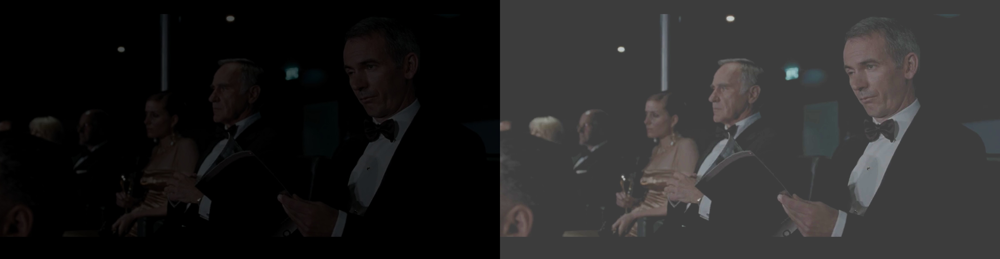

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
%cd "/content/drive/My Drive/Colab Notebooks/Assignment_1"

#sub Q1
import numpy as np
def linContrastStretching(img, a, b):
  xmin = np.amin(img)
  xmax = np.amax(img)
  ymin = a
  ymax = b
  newimg = np.ones(img.shape)
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      for k in range (img.shape[2]):
        x = img[i][j][k]
        newimg[i][j][k] = int(ymin + (x - xmin)*((ymax - ymin)/(xmax - xmin)))
  return newimg

#sub Q2
img = cv2.imread('images/quantum_bad.jpg')
newimg = linContrastStretching(img, 60, 210)
numpy_horizontal_concat = np.concatenate((img, newimg), axis=1)
cv2_imshow(numpy_horizontal_concat)

##Q4


In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
%cd "/content/drive/My Drive/Colab Notebooks/Assignment_1"
#sub 1
def bitQuantizeImage(x, K):
  y = np.zeros(x.shape)
  for i in range(x.shape[0]):
    for j in range(x.shape[1]):
      pixel = x[i][j]  
      y[i][j] = int(pixel / (2**(8-k)))
  return y



/content/drive/My Drive/Colab Notebooks/Assignment_1


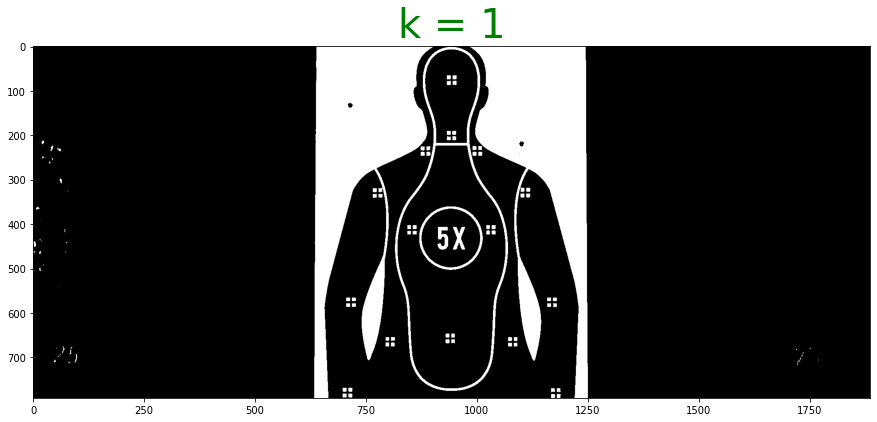

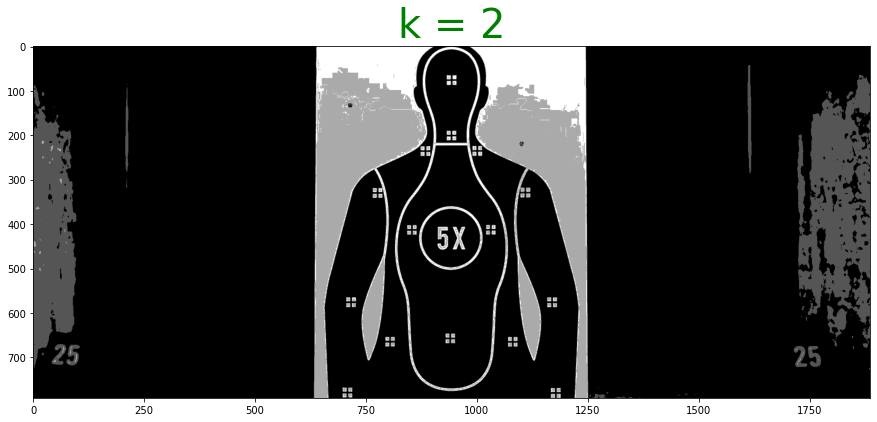

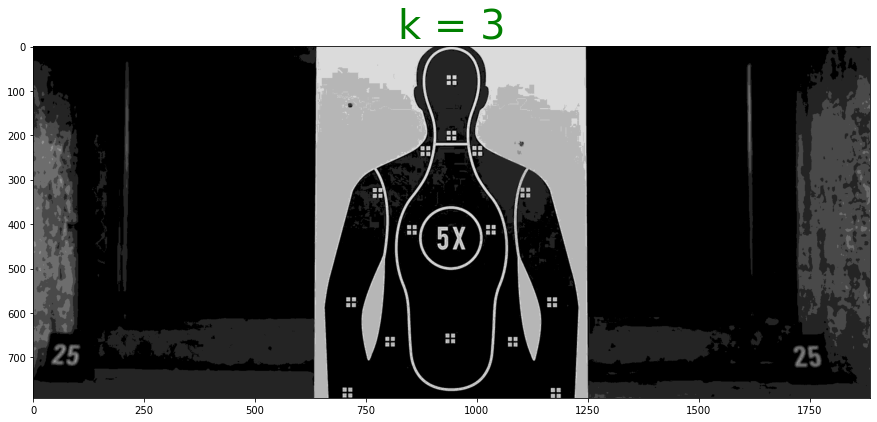

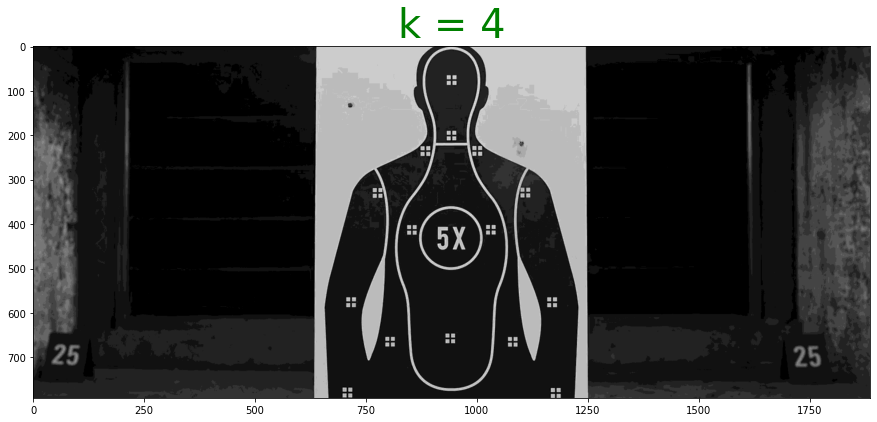

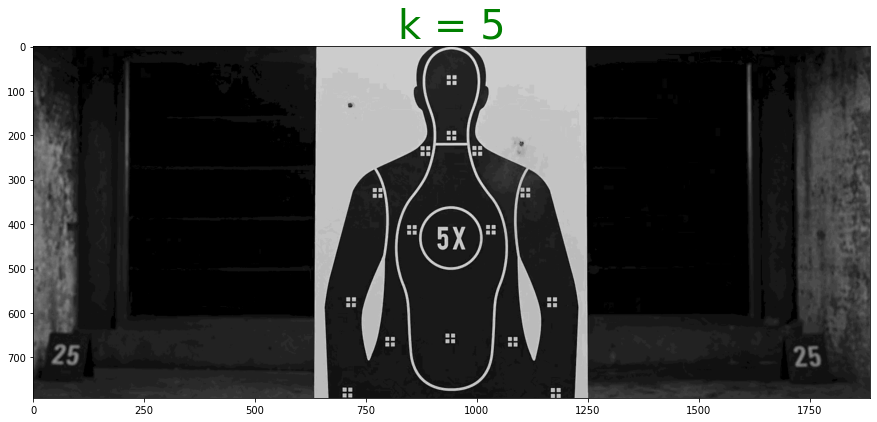

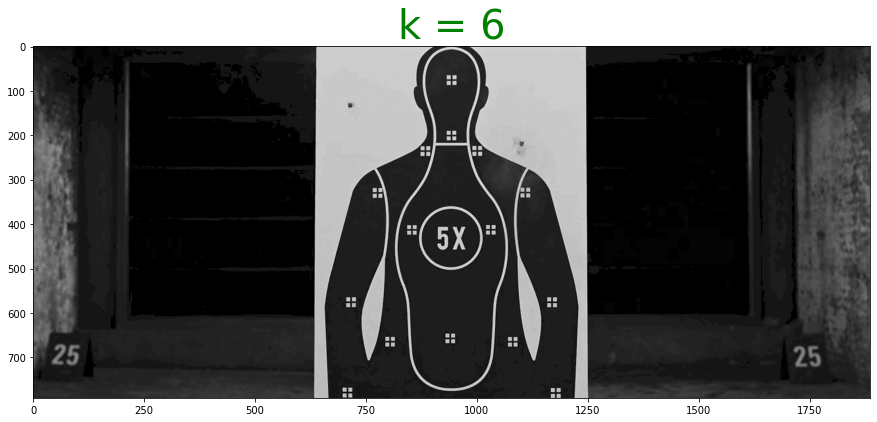

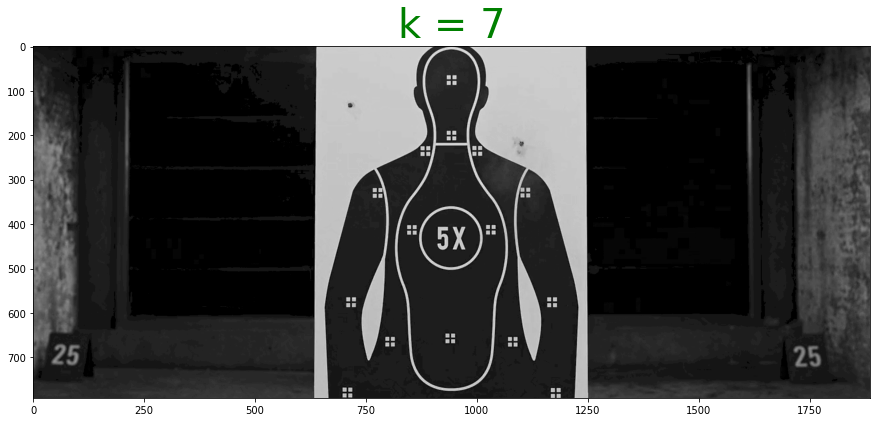

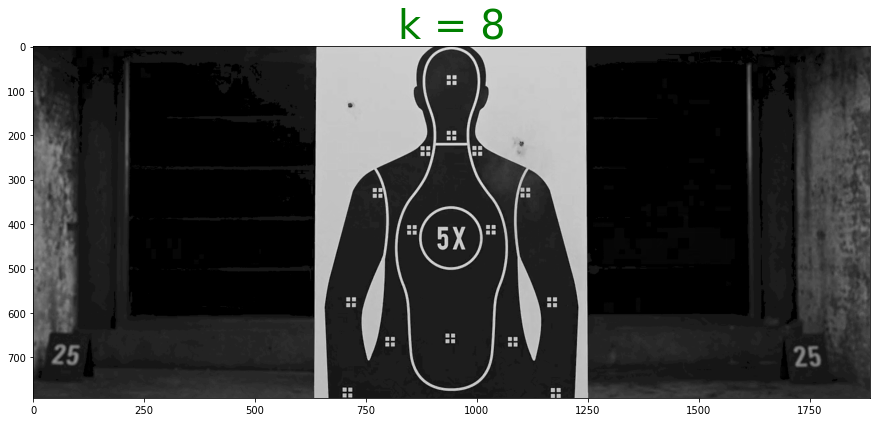

In [ ]:
#sub 2
import matplotlib.pyplot as plt  
res = [0]*9
for k in range(1,9):
 
  plt.figure(figsize=(15,15))
  img = cv2.imread('images/007_test1.png', 0)
  res[k] = bitQuantizeImage(img, k)
  plt.imshow(res[k], cmap = 'gray')
  plt.title(label = "k = " + str(k), color = "green" , fontsize = 40)
  

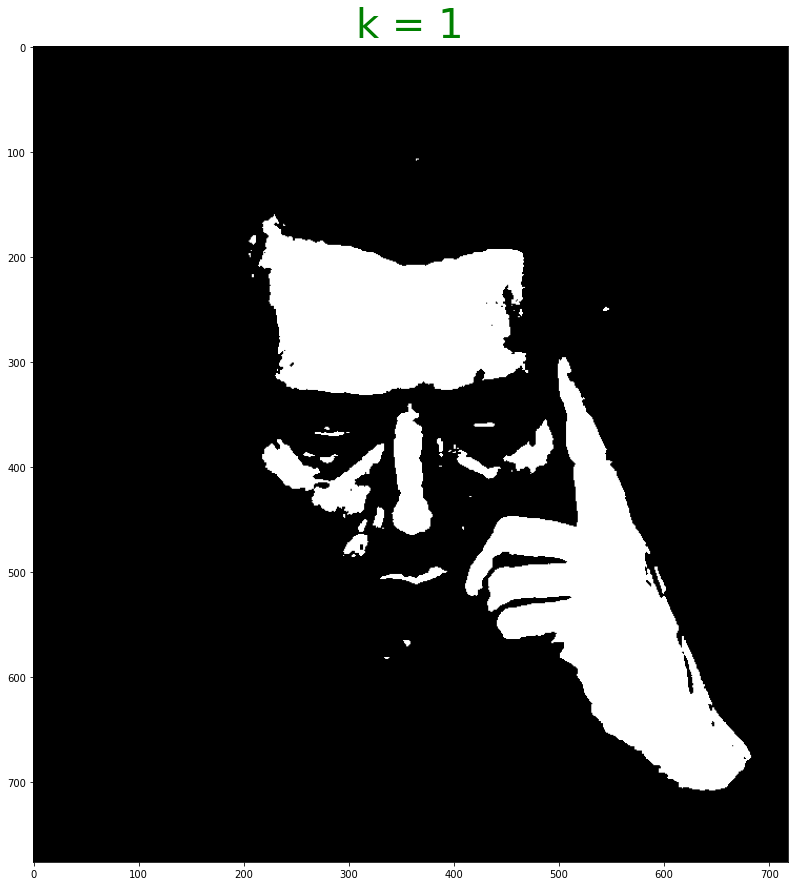

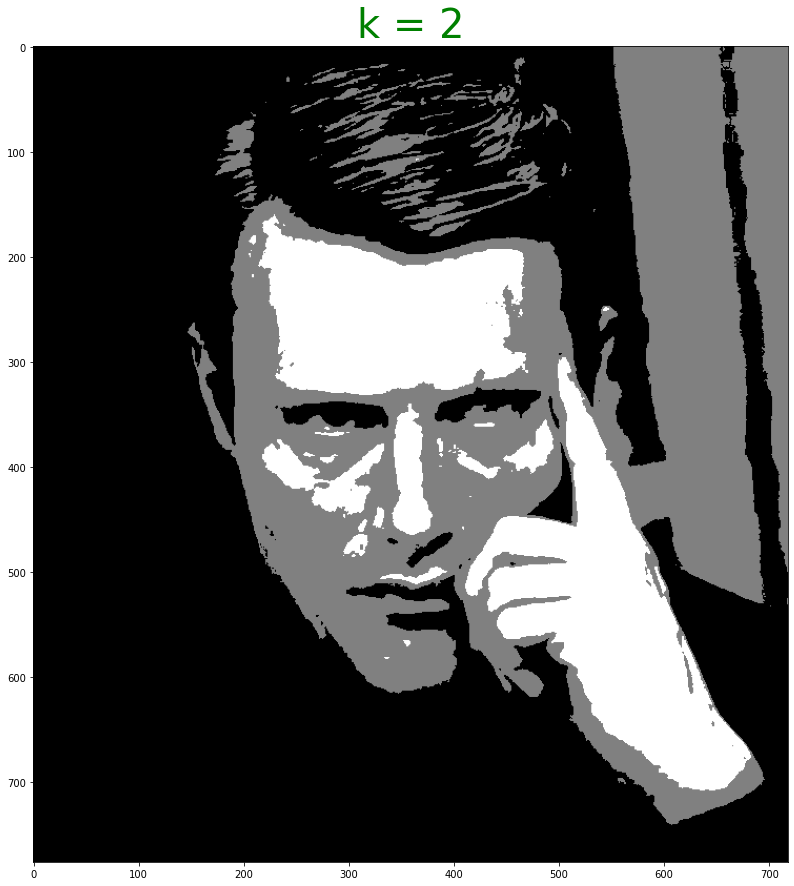

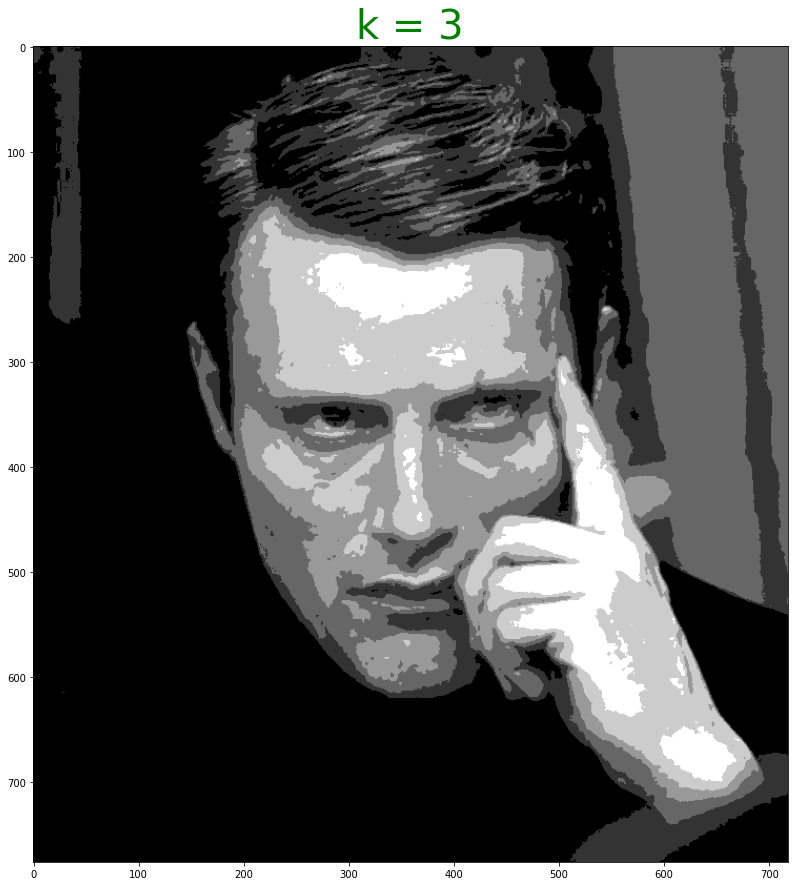

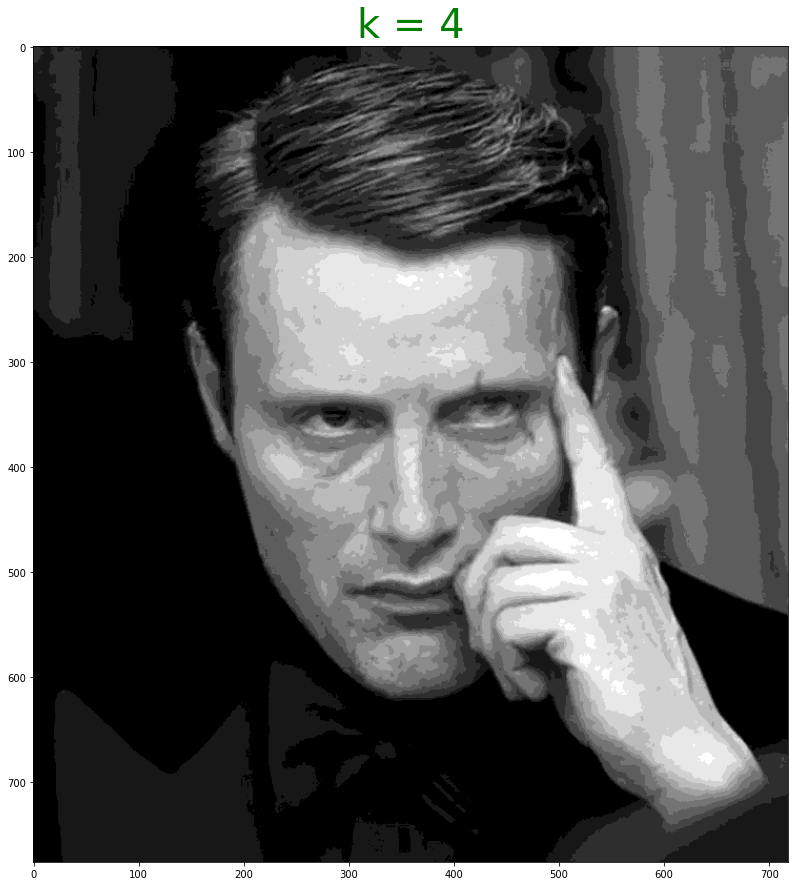

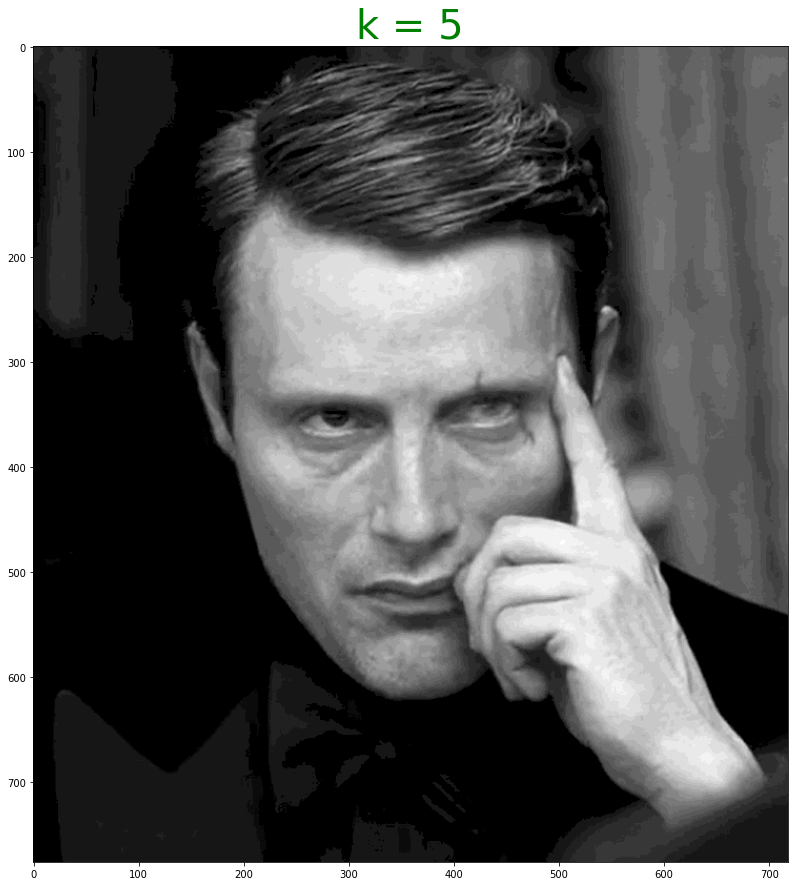

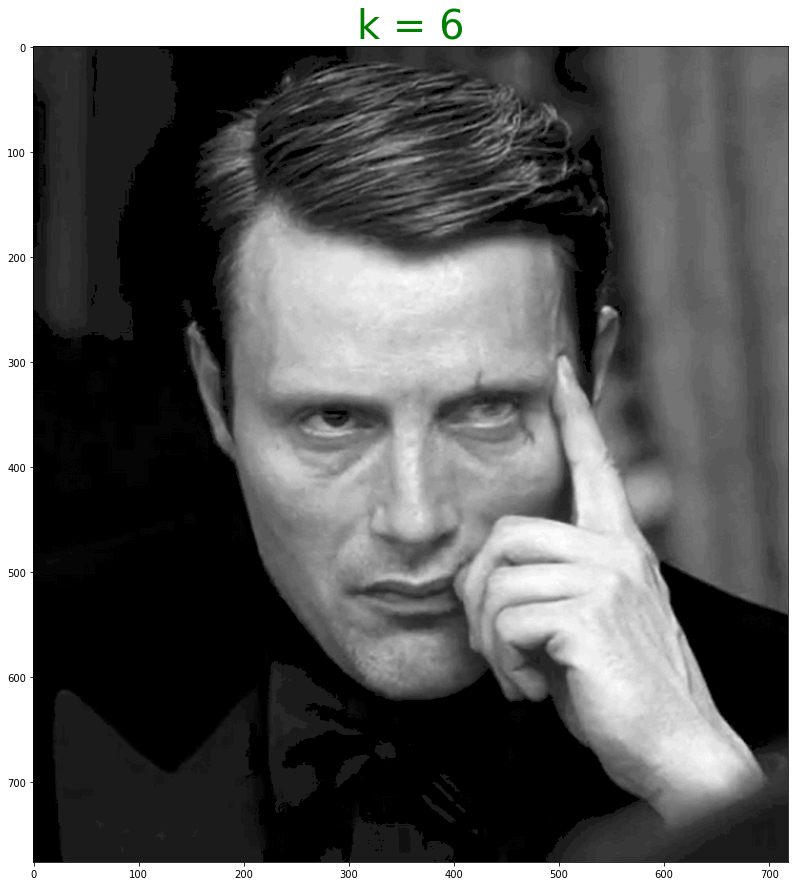

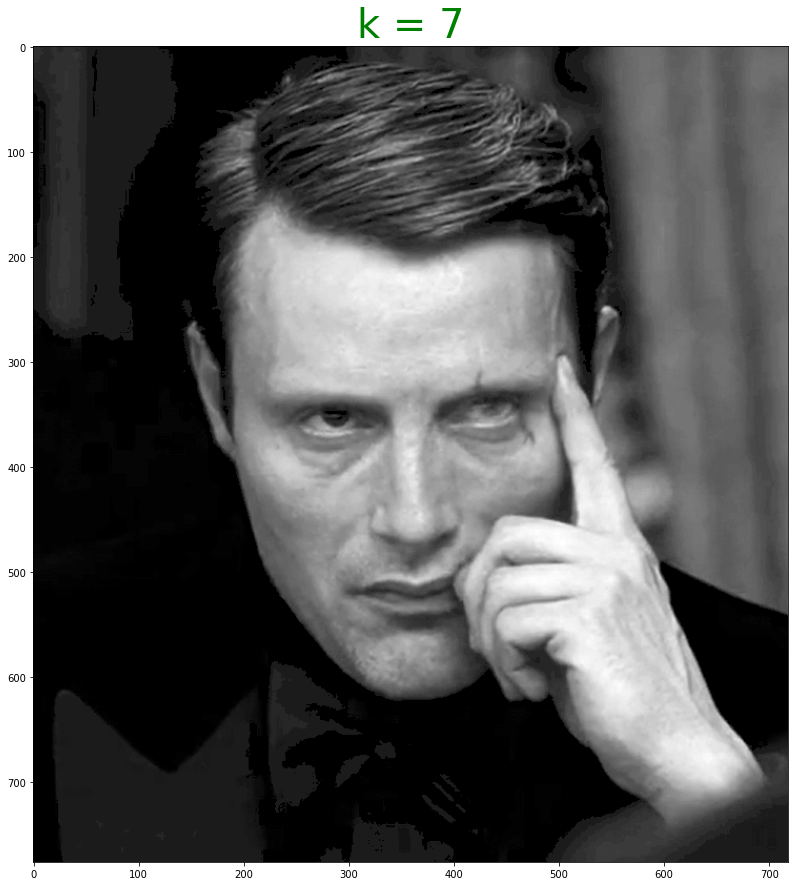

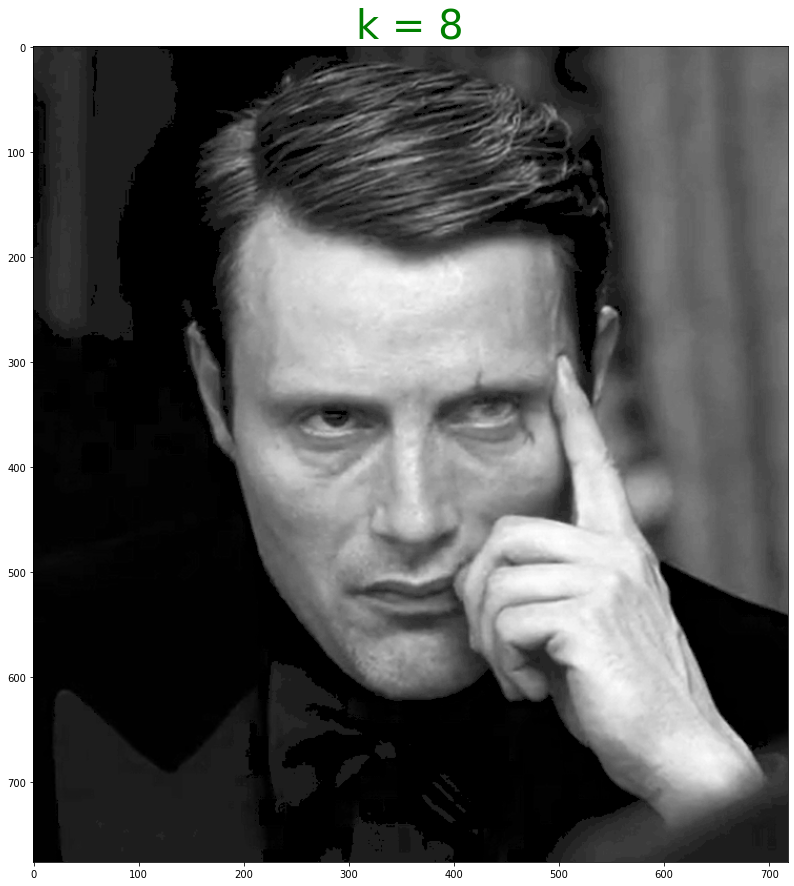

In [ ]:
#sub q 3
res = [0]*9
for k in range(1,9):
  img = cv2.imread('images/007_test2.png', 0)
  res[k] = bitQuantizeImage(img, k)
  plt.figure(figsize=(15,15))
  plt.imshow(res[k], cmap = 'gray')
  plt.title(label = "k = " + str(k), color = "green" , fontsize = 40)
  


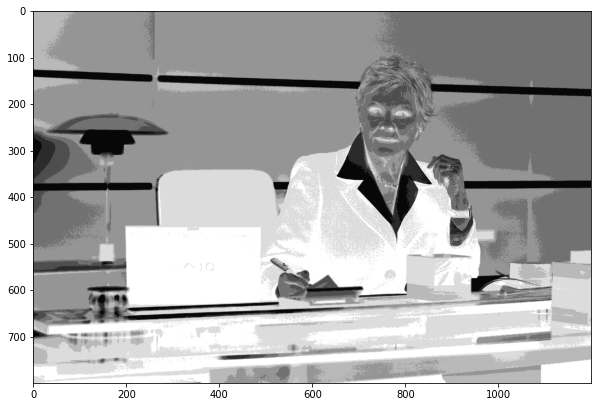

In [ ]:
#sub Q4
img1 = cv2.imread('./images/m.jpg' ,0 )
img2 = cv2.imread('./images/m_corrupt.jpg' ,0)

plt.figure(figsize=(10,10))
plt.imshow(img2 ,cmap='gray')

Text(0.5, 1.0, 'k = 3')

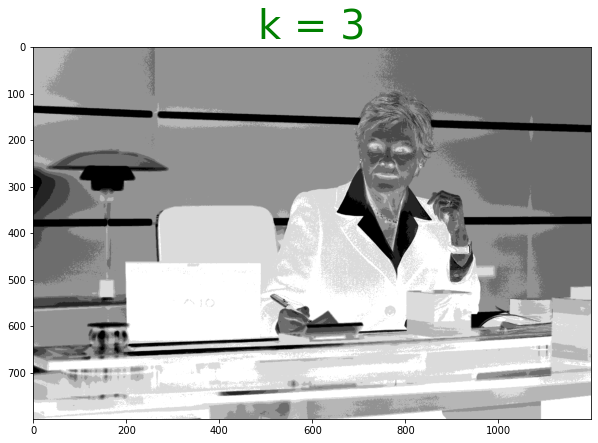

In [ ]:
res = [0]*9
for i in range(img1.shape[0]):
  for j in range(img2.shape[1]):
    img1[i][j] = 255 - img1[i][j]
k = 3
res[k] = bitQuantizeImage(img1, k)
plt.figure(figsize=(10,10))
plt.imshow(res[k], cmap = 'gray')
plt.title(label = "k = " + str(k), color = "green" , fontsize = 40)
  

##**Q6**

In [7]:
def imhist(im):
	m, n = im.shape
	h = [0.0] * 256
	for i in range(m):
		for j in range(n):
			h[im[i, j]]+=1
	return np.array(h)
 
def cumsum(h):
	return [sum(h[:i+1]) for i in range(len(h))]

def histEqualization(image):    
  
    histogram = imhist(image)
    cdf = np.array(cumsum(histogram))
    temp = ((cdf - cdf.min())*255)/(cdf.max() - cdf.min())
    temp = temp.astype('uint8')
    x = image.flatten()
    return np.reshape(temp[x], image.shape)


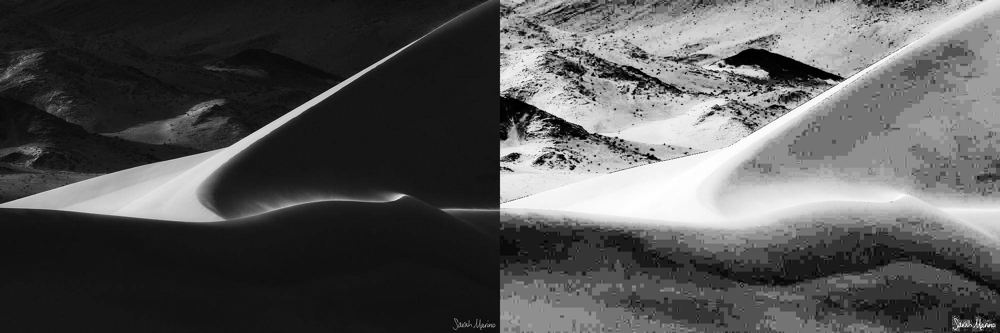

/content/drive/My Drive/Colab Notebooks/Assignment_1


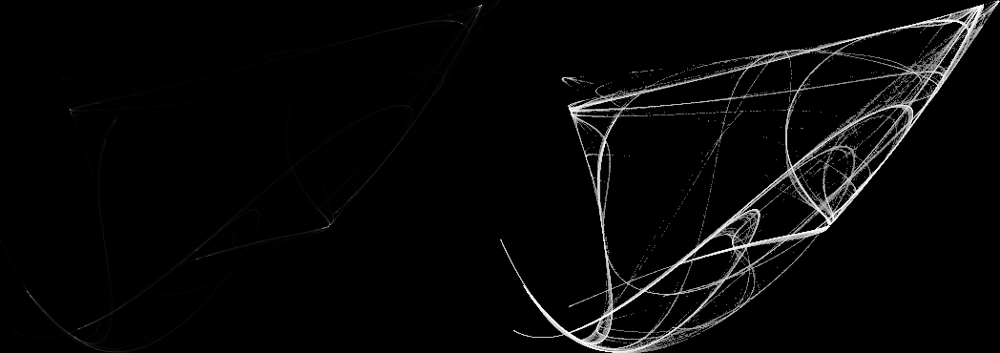

In [ ]:
#sub Q4
img = cv2.imread('./images/practice_range1.jpg',0)
newimg = histEqualization(img1)
numpy_horizontal_concat = np.concatenate((img, newimg), axis=1)
cv2_imshow(numpy_horizontal_concat)
!pwd
img = cv2.imread('./images/hist.png',0)
newimg = histEqualization(img)
numpy_horizontal_concat = np.concatenate((img, newimg), axis=1)
cv2_imshow(numpy_horizontal_concat)


In [8]:
def cumsum(h):
	return [sum(h[:i+1]) for i in range(len(h))]

def getcumprb(s_counts, t_counts):
    s_quantiles = cumsum(s_counts)
    s_quantiles /= s_quantiles[-1]
    t_quantiles = np.cumsum(t_counts).astype(np.float64)
    t_quantiles /= t_quantiles[-1]
    return s_quantiles,t_quantiles

def hist_match(source, template):
  
    oldshape = source.shape
    source = source.ravel()
    template = template.ravel()

    s_values, bin_idx, s_counts = np.unique(source, return_inverse=True,
                                            return_counts=True)
    t_values, t_counts = np.unique(template, return_counts=True)

    s_quantiles, t_quantiles = getcumprb(s_counts, t_counts)
    
    interp_t_values = np.interp(s_quantiles, t_quantiles, t_values)

    return interp_t_values[bin_idx].reshape(oldshape)

source = cv2.imread('./images/Map.jpg',0)
referance = cv2.imread("./images/satellite_img.jpg",0)
output = np.zeros_like(source)
output= hist_match(source, referance)

cv2_imshow(output)  

Output hidden; open in https://colab.research.google.com to view.

##**Q7**

In [ ]:
#sub Q1
from google.colab.patches import cv2_imshow
import cv2
def piecewiseLinTransform(img, k1, k2, seg):
  res = img.copy()
  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      pix = img[i][j]
      segno = -1
      for k in range(len(seg)):
        if(pix >= seg[k][0] and pix < seg[k][1]):
            segno = k
            break
      res[i][j] = (k1[segno]*pix + k2[segno])
  return res

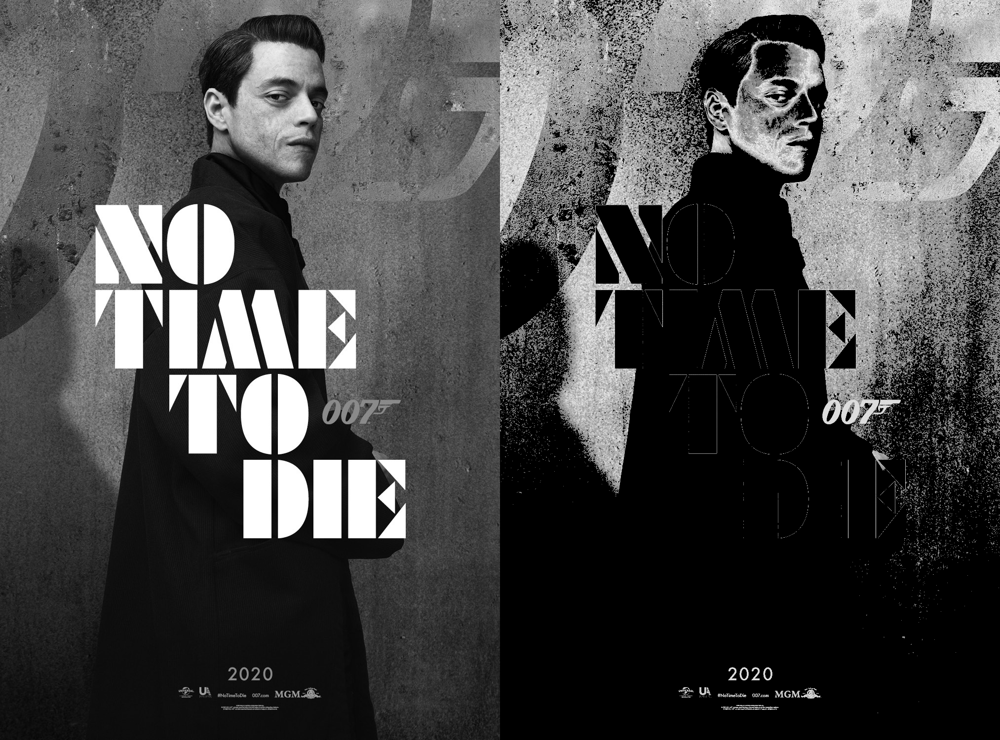

In [ ]:
#sub Q2
img = cv2.imread('./images/bondvillain1.jpg' ,0 )
seg_list = [ [0,76] , [76 ,153] ,[153 ,204] ,[204 ,256]]
k1 = [0 ,1.6 , -2   ,0 ]
k2 = [0 ,-0.08 , -1.68 ,0]

newimg = piecewiseLinTransform(img ,k1,k2,seg_list)
numpy_horizontal_concat = np.concatenate((img, newimg), axis=1)
cv2_imshow(numpy_horizontal_concat)

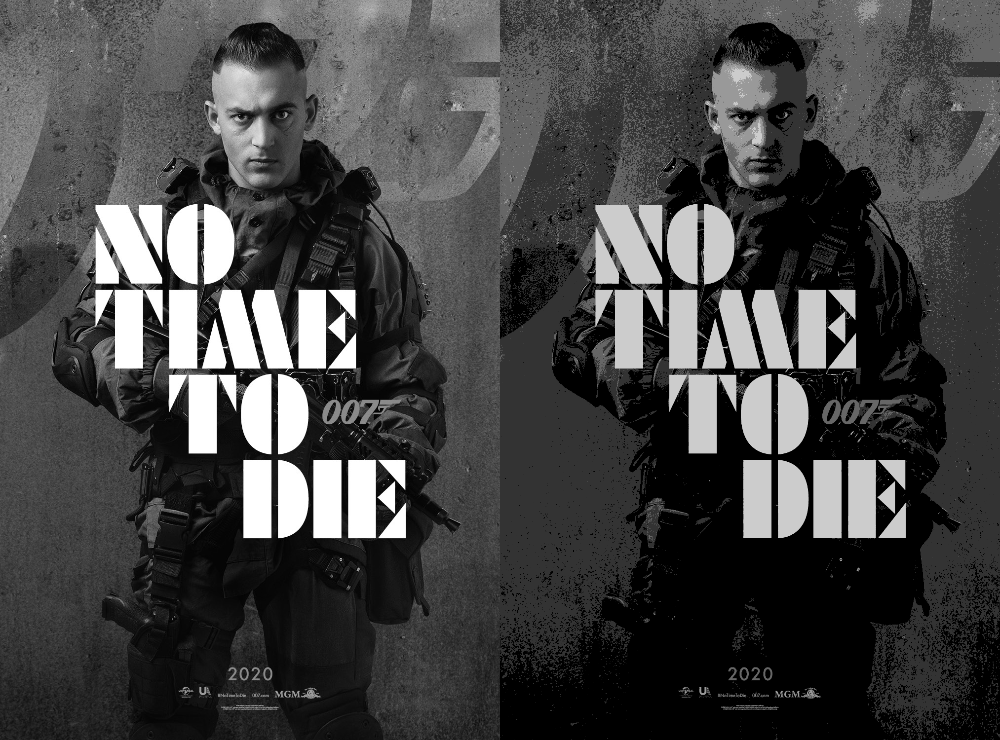

In [ ]:
#sub Q2
img = cv2.imread('./images/bondvillain2.jpg',0)
seg = [[0,51] ,[51,102] ,[102 ,153] ,[153 ,204] ,[204 ,256]]
k1 = [0 ,0  ,0   ,0   ,0 ]
k2 = [0 ,51 ,102 ,153 ,204]

newimg = piecewiseLinTransform(img ,k1,k2,seg)
numpy_horizontal_concat = np.concatenate((img, newimg), axis=1)
cv2_imshow(numpy_horizontal_concat)

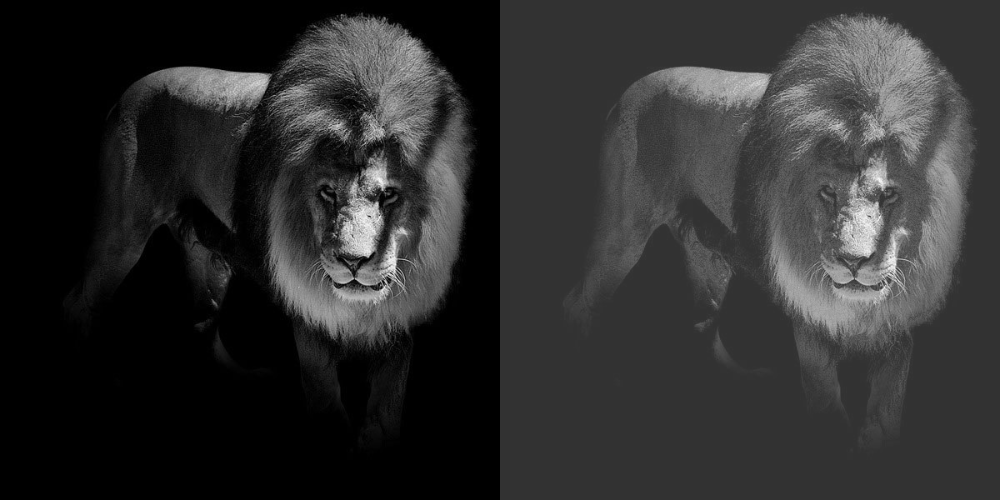

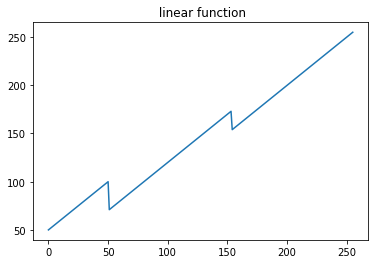

In [ ]:
#sub Q3
#sub Q2
img = cv2.imread('./images/rblion.jpg',0)
seg = [[0,51] ,[51,153] ,[153,256]]
k1 = [1 , 1 ,1]
k2 = [50 ,20 ,0]

newimg = piecewiseLinTransform(img ,k1,k2,seg)
numpy_horizontal_concat = np.concatenate((img, newimg), axis=1)
cv2_imshow(numpy_horizontal_concat)
x = [0,50,51 ,153 , 154, 255] 
y = [50,100,71 ,173 ,154, 255] 
  
plt.plot(x, y) 
plt.title(' linear function') 
   
plt.show()

##Q8

In [19]:
#sub Q1
def gammaTransform(img ,gamma):
    op = np.zeros(img.shape)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            op[i][j] =  (( img[i][j] / 255 )**gamma)*255

    return op

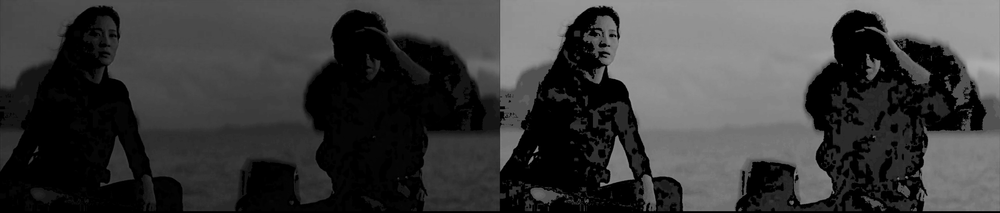

In [ ]:
#sub Q2
#gama = .45
import numpy as np
img = cv2.imread('./images/stealth.png', 0)

for i in [0.45]:
  output = gammaTransform(img , i)
  numpy_horizontal_concat = np.concatenate((img, output), axis=1)
  cv2_imshow(numpy_horizontal_concat)

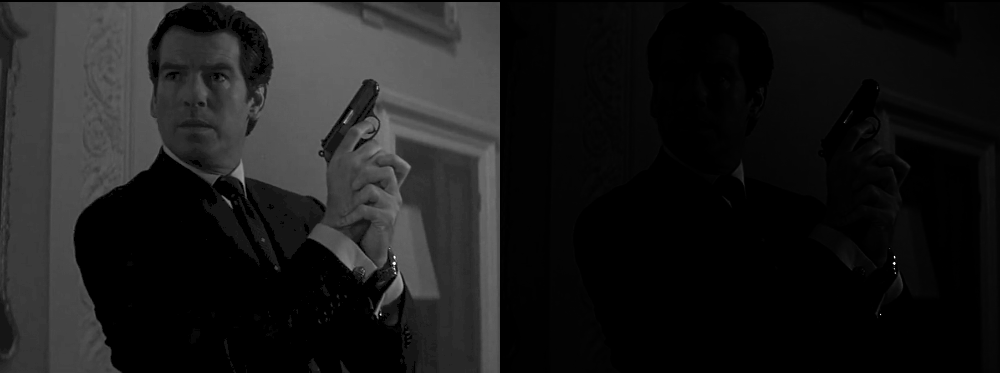

In [ ]:
#sub Q3
img = cv2.imread('./images/unstealth.png',0)
#gama 3.25
for i in [3.25]:
  output = gammaTransform(img , i)
  numpy_horizontal_concat = np.concatenate((img, output), axis=1)
  cv2_imshow(numpy_horizontal_concat)

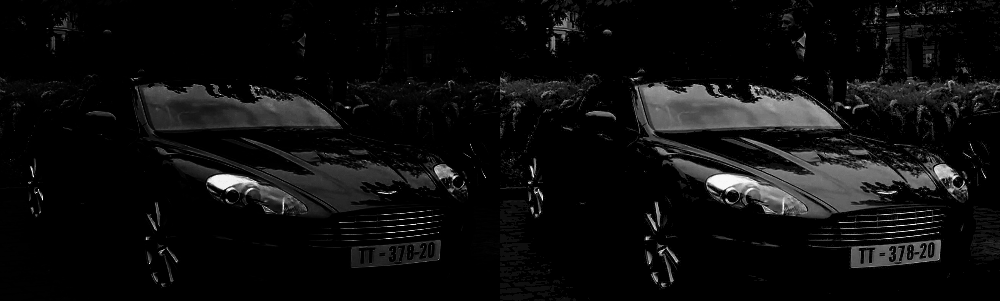

In [ ]:
#sub Q4
img = cv2.imread('./images/aston_invisible.jpg',0)
output = gammaTransform(img ,0.5)

numpy_horizontal_concat = np.concatenate((img, output), axis=1)
cv2_imshow(numpy_horizontal_concat)

##Q9


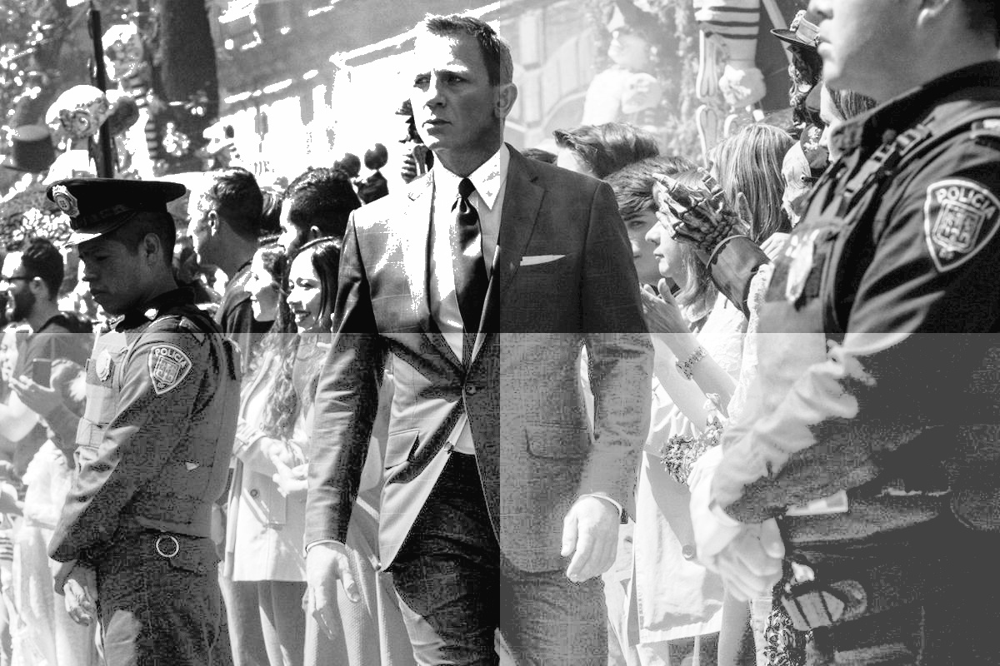

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
part1 = cv2.imread('./images/james1.jpg', 0)
part2 = cv2.imread('./images/james2.jpg', 0)
part3 = cv2.imread('./images/james3.jpg', 0)
part4 = cv2.imread('./images/james4.jpg', 0)

temp1 = cv2.hconcat([part1 ,part2])
temp2 = cv2.hconcat([part3,part4])

final = cv2.vconcat([temp1,temp2])
cv2_imshow(final)

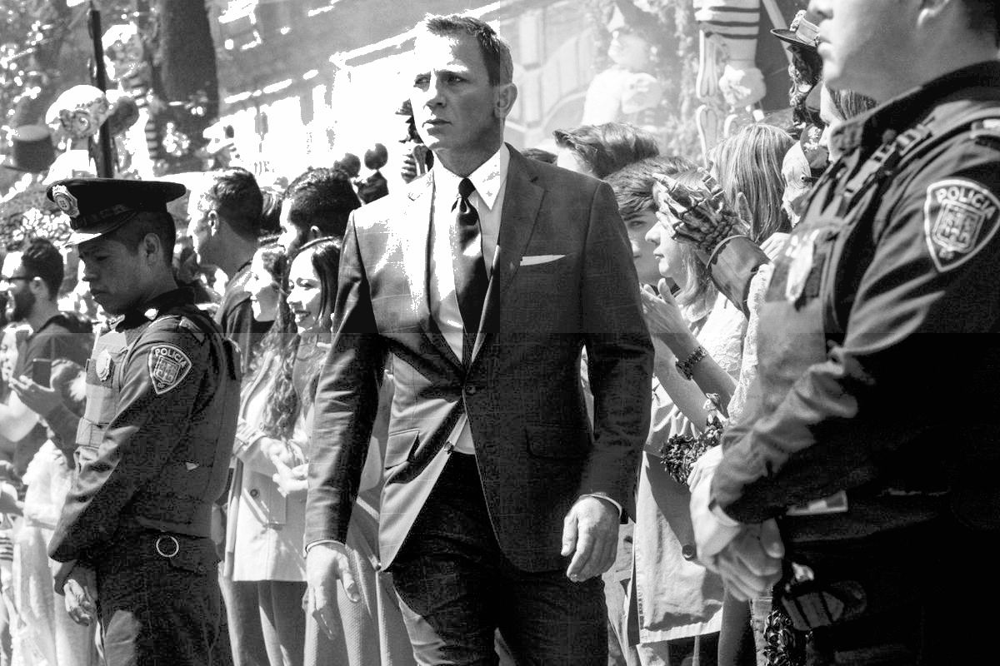

In [47]:
tpart1= gammaTransform(part1 ,0.85).astype('uint8')
tpart2= gammaTransform(part2, 0.95).astype('uint8')
tpart4= gammaTransform(part4 ,3.5).astype('uint8')

tpart3 = gammaTransform(part3, 1.5).astype('uint8')

temp1 = cv2.hconcat([tpart1 ,tpart2])
temp2 = cv2.hconcat([tpart3,tpart4])

tfinal = cv2.vconcat([temp1,temp2])
cv2_imshow(tfinal)